# Imports

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skfda
import copy

from sklearn.metrics import accuracy_score, classification_report
from skfda.ml.classification import KNeighborsClassifier
from skfda.ml.classification import LogisticRegression
from skfda.ml.classification import RadiusNeighborsClassifier
from skfda.ml.classification import NearestCentroid
from skfda.ml.classification import DTMClassifier
from skfda.ml.classification import DDClassifier
from skfda.ml.classification import DDGClassifier
from skfda.ml.classification import MaximumDepthClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder,LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.neural_network import MLPClassifier
from skfda.ml.clustering import KMeans
import pandas as pd
import seaborn as sns
from collections import OrderedDict 

from sklearn.model_selection import (train_test_split, GridSearchCV,
                                     StratifiedShuffleSplit)

from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
#from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

from skfda import datasets
from skfda.exploratory.depth import ModifiedBandDepth
from skfda.exploratory.visualization import DDPlot
from skfda.ml.classification import (
    DDClassifier,
    DDGClassifier,
    MaximumDepthClassifier,
)
from skfda.preprocessing.dim_reduction.feature_extraction import DDGTransformer
from skfda.representation.grid import FDataGrid

# Read csv files

In [3]:
cellem_data = pd.read_csv("cellem.data.csv", sep=",").drop(columns=['Unnamed: 0'])
cellem_data.head()

,cell.name,cell.type,type.num,exp.number,exptype,passing.time,elec.duration,VLF.real,VLF.imag,VMF.real,...,VHF.real,VHF.imag,VLF.ampl,VMF.ampl,VHF.ampl,opacity,phase.ratio,contrast,cub.VLF.real,cub.VHF.imag
0,20210507-143929_1,M0,1,1,1-M0,2336.642066,0.000764,3.579021,4.959221,11.571011,...,11.571011,15.452342,6.115821,19.304485,19.304485,3.156483,0.981378,0.160466,1.529636,2.490757
1,20210507-143929_2,M0,1,1,1-M0,2336.806435,0.000834,1.277016,1.921778,5.287360,...,5.287360,6.087034,2.307380,8.062764,8.062764,3.494338,0.869237,0.376720,1.084923,1.825865
2,20210507-143929_3,M0,1,1,1-M0,2337.033097,0.000695,1.435114,1.996665,5.246355,...,5.246355,6.434529,2.458908,8.302253,8.302253,3.376399,0.935812,0.380580,1.127965,1.859969
3,20210507-143929_4,M0,1,1,1-M0,2337.298741,0.000695,2.645617,3.856939,10.443150,...,10.443150,12.208574,4.677101,16.065760,16.065760,3.434983,0.890269,0.190346,1.383064,2.302617
4,20210507-143929_5,M0,1,1,1-M0,2337.423120,0.000973,2.486226,3.296691,8.630322,...,8.630322,10.760939,4.129103,13.794211,13.794211,3.340728,0.967766,0.234377,1.354712,2.207751


# Cell 1 example

In [4]:
folder_wavee_data = "data_set/20210507_cyto_E2_MJ_data_set"
icell = 1
file_open=folder_wavee_data+'/'+cellem_data['cell.name'][icell-1]+'_wavee.txt'
wavee_data=pd.read_csv(file_open, sep=",",usecols = ['cell passing time (s)','1 MHz real (mV)','1 MHz imag (mV)','5 MHz real (mV)','5 MHz imag (mV)'])
file_open

'data_set/20210507_cyto_E2_MJ_data_set/20210507-143929_1_wavee.txt'

In [5]:
wavee_data.head()

,cell passing time (s),1 MHz real (mV),1 MHz imag (mV),5 MHz real (mV),5 MHz imag (mV)
0,0.000000,0.279441,-0.091514,-0.570668,0.647636
1,0.085714,0.235093,-0.096990,-0.495923,0.591538
2,0.171429,0.200954,-0.113390,-0.567218,0.729810
3,0.257143,0.117548,-0.147099,-0.634938,0.854698
4,0.342857,0.009965,-0.169478,-0.824968,1.065992


## Plots cell 1 example

### Scatter Plot for Cell 1 VLF real

Text(0, 0.5, 'VLF real (mV)')

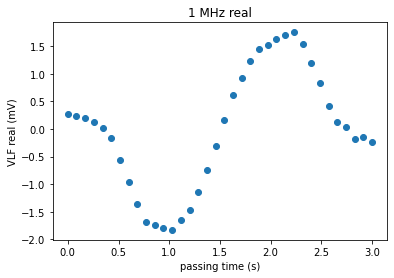

In [6]:
x=wavee_data['cell passing time (s)']
y=wavee_data['1 MHz real (mV)']
plt.scatter(x,y)
plt.title('1 MHz real')
plt.xlabel('passing time (s)')
plt.ylabel('VLF real (mV)')

### B-spline for Cell 1 VLF real (2 methods)

In [7]:
import scipy.interpolate as interpolate

t: [0.         0.         0.         0.         0.         0.21428573
 0.30000006 0.38571433 0.4714286  0.55714287 0.64285713 0.7285714
 0.81428573 0.90000006 0.98571433 1.0714286  1.15714287 1.24285713
 1.3285714  1.41428573 1.50000006 1.58571433 1.6714286  1.75714287
 1.84285713 1.9285714  2.01428573 2.10000006 2.18571433 2.2714286
 2.35714287 2.44285713 2.5285714  2.61428573 2.70000006 2.78571433
 3.         3.         3.         3.         3.        ]
c: [ 0.27944113  0.22046801  0.25579848  0.16867973  0.00289365 -0.0769343
 -0.59063041 -0.94353338 -1.35748153 -1.78318064 -1.70266856 -1.77686922
 -1.91977135 -1.60869409 -1.50825045 -1.16299628 -0.73803808 -0.32817187
  0.16252653  0.65761146  0.89865651  1.26502498  1.48544292  1.48292099
  1.65854263  1.66889918  1.84549627  1.55439588  1.18993564  0.84248451
  0.39863723  0.02912632  0.18302343 -0.62255504  0.18653655 -0.23162213
  0.          0.          0.          0.          0.        ]
k: 4



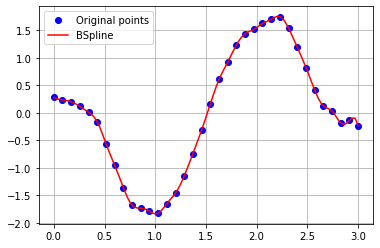

In [8]:
t, c, k = interpolate.splrep(x, y, s=0, k=4)
print('''\
t: {}
c: {}
k: {}
'''.format(t, c, k))
N = 100
xmin, xmax = x.min(), x.max()
xx = np.linspace(xmin, xmax, N)
spline = interpolate.BSpline(t, c, k, extrapolate=False)

plt.plot(x, y, 'bo', label='Original points')
plt.plot(xx, spline(xx), 'r', label='BSpline')
plt.grid()
plt.legend(loc='best')
plt.show()

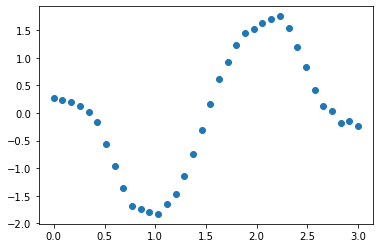

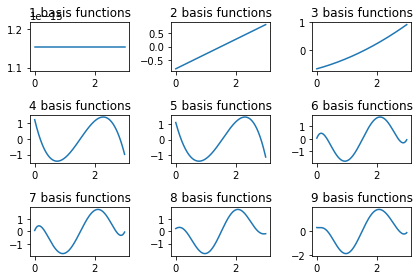

In [9]:
x=wavee_data['cell passing time (s)']
y=wavee_data['1 MHz real (mV)']
max_basis = 9
X = FDataGrid(y, x)
X.scatter()

fig, axes = plt.subplots(nrows=3, ncols=3)

for n_basis in range(1, max_basis + 1):
    basis = skfda.representation.basis.Monomial(n_basis=n_basis)
    X_basis = X.to_basis(basis)

    ax = axes.ravel()[n_basis - 1]
    fig = X_basis.plot(axes=ax)
    ax.set_title(f"{n_basis} basis functions")

fig.tight_layout()
plt.show()

### Scatter Plots all data from Cell 1

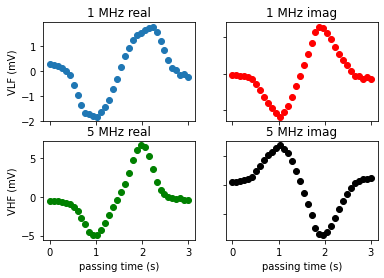

In [10]:
x=wavee_data['cell passing time (s)']
y1=wavee_data['1 MHz real (mV)']
y2=wavee_data['1 MHz imag (mV)']
y3=wavee_data['5 MHz real (mV)']
y4=wavee_data['5 MHz imag (mV)']
fig, axs = plt.subplots(2, 2)
axs[0, 0].scatter(x, y1)
axs[0, 0].set_title('1 MHz real')
axs[0, 0].set(ylabel='VLF (mV)')

axs[0, 1].scatter(x, y2,c = 'red')
axs[0, 1].set_title('1 MHz imag')


axs[1, 0].scatter(x, y3,c = 'green')
axs[1, 0].set_title('5 MHz real')
axs[1, 0].set(xlabel='passing time (s)')
axs[1, 0].set(ylabel='VHF (mV)')

axs[1, 1].scatter(x, y4,c = 'black')
axs[1, 1].set_title('5 MHz imag')
axs[1, 1].set(xlabel='passing time (s)')


# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

# Multiple cells

In [11]:
folder_wavee_data = "data_set/20210507_cyto_E2_MJ_data_set"
mergeDataSets = []
#frames = [df1, df2, df3]
#result = pd.concat(frames)
for icell in range(len(cellem_data)):
    file_open=folder_wavee_data+'/'+cellem_data['cell.name'][icell]+'_wavee.txt'
    wavee_data=pd.read_csv(file_open, sep=",",usecols = ['cell passing time (s)','1 MHz real (mV)','1 MHz imag (mV)','5 MHz real (mV)','5 MHz imag (mV)'])
    wavee_data['cell name']=cellem_data['cell.name'][icell]
    mergeDataSets.append(wavee_data)

In [12]:
mergeDataSets[0:5]

[    cell passing time (s)  1 MHz real (mV)  1 MHz imag (mV)  5 MHz real (mV)  \
 0                0.000000         0.279441        -0.091514        -0.570668   
 1                0.085714         0.235093        -0.096990        -0.495923   
 2                0.171429         0.200954        -0.113390        -0.567218   
 3                0.257143         0.117548        -0.147099        -0.634938   
 4                0.342857         0.009965        -0.169478        -0.824968   
 5                0.428571        -0.164539        -0.275417        -0.956440   
 6                0.514286        -0.559258        -0.592473        -1.259813   
 7                0.600000        -0.955545        -0.916956        -1.855401   
 8                0.685714        -1.358709        -1.266178        -2.715092   
 9                0.771429        -1.680790        -1.632515        -3.565104   
 10               0.857143        -1.732955        -1.885917        -4.554430   
 11               0.942857  

## Plot multiple cells data

### VLF real

Text(0, 0.5, 'VLF real (mV)')

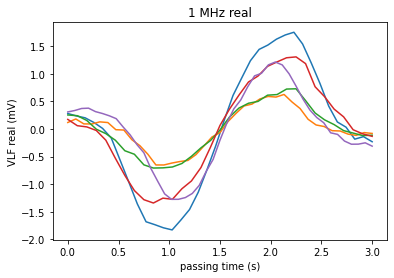

In [13]:
for i in range(len(mergeDataSets[:5])):
    x=mergeDataSets[i]['cell passing time (s)']
    y=mergeDataSets[i]['1 MHz real (mV)']
    plt.plot(x,y)
plt.title('1 MHz real')
plt.xlabel('passing time (s)')
plt.ylabel('VLF real (mV)')

### VLF imag

Text(0, 0.5, 'VLF imag (mV)')

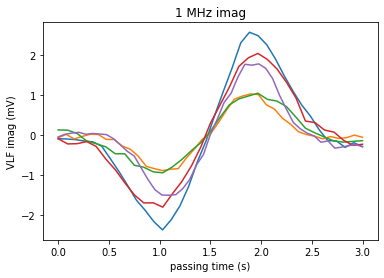

In [14]:
for i in range(len(mergeDataSets[:5])):
    x=mergeDataSets[i]['cell passing time (s)']
    y=mergeDataSets[i]['1 MHz imag (mV)']
    plt.plot(x,y)
plt.title('1 MHz imag')
plt.xlabel('passing time (s)')
plt.ylabel('VLF imag (mV)')

### VHF real

Text(0, 0.5, 'VHF real (mV)')

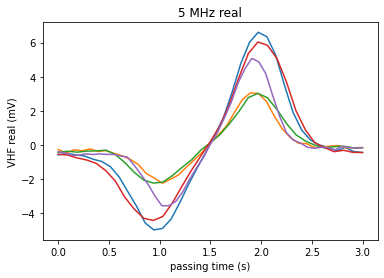

In [15]:
for i in range(len(mergeDataSets[:5])):
    x=mergeDataSets[i]['cell passing time (s)']
    y=mergeDataSets[i]['5 MHz real (mV)']
    plt.plot(x,y)
plt.title('5 MHz real')
plt.xlabel('passing time (s)')
plt.ylabel('VHF real (mV)')

### VHF imag

Text(0, 0.5, 'VHF real (mV)')

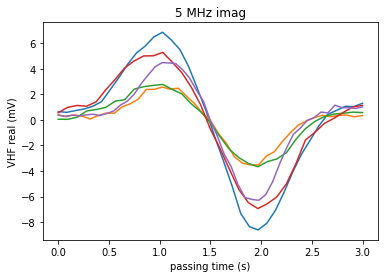

In [16]:
for i in range(len(mergeDataSets[:5])):
    x=mergeDataSets[i]['cell passing time (s)']
    y=mergeDataSets[i]['5 MHz imag (mV)']
    plt.plot(x,y)
plt.title('5 MHz imag')
plt.xlabel('passing time (s)')
plt.ylabel('VHF real (mV)')

## B-spline on multiple cells 

### Transform all VLF data to FDA

In [56]:
fdMergeDataSets=[]
for i in range(len(mergeDataSets)):
    x=mergeDataSets[:][i]['cell passing time (s)']
    y=mergeDataSets[:][i]['1 MHz real (mV)']
    fdMergeDataSets.append(FDataGrid(y, x))
len(fdMergeDataSets)

4938

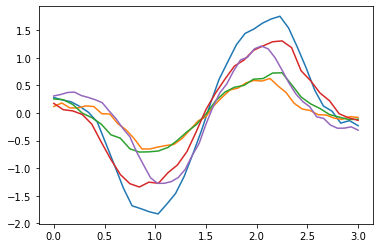

In [57]:
for i in range(len(fdMergeDataSets[:5])):
    plt.plot(fdMergeDataSets[i].grid_points[0],fdMergeDataSets[i].data_matrix[0])
plt.show()

In [58]:
splinedMergeDataSets=[]
for i in range(len(fdMergeDataSets)):
    basis = skfda.representation.basis.Monomial(n_basis=n_basis)
    temp = fdMergeDataSets[i].to_basis(basis)
    splinedMergeDataSets.append(temp)
len(splinedMergeDataSets)

4938

In [59]:
splinedMergeDataSetsCorrect = splinedMergeDataSets
for i in range(1,len(splinedMergeDataSets)):
    b = splinedMergeDataSets[i].coefficients
    splinedMergeDataSetsCorrect[0].coefficients = np.append(splinedMergeDataSetsCorrect[0].coefficients,b,axis=0)
len(splinedMergeDataSetsCorrect[0])

4938

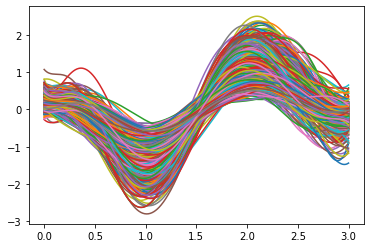

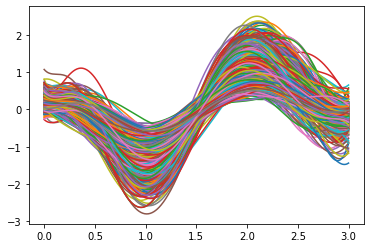

In [60]:
splinedMergeDataSetsCorrect[0].plot()

In [23]:
splinedMergeDataSetsCorrect[0]

FDataBasis(
    basis=Monomial(domain_range=((0.0, 3.0),), n_basis=9),
    coefficients=[[ 2.56209513e-01 -6.00138931e-01  9.59710640e+00 ...  1.70590995e+01
      -2.99322502e+00  2.13655321e-01]
     [ 1.46357783e-01 -1.27486346e+00  1.13406234e+01 ...  6.62487618e+00
      -8.80811021e-01  3.90726807e-02]
     [ 2.57192715e-01 -1.48564001e-01 -2.14660834e+00 ...  6.86803559e-01
       1.18060124e-02 -1.18089857e-02]
     ...
     [ 2.35107894e-01 -3.33334480e-01 -3.26773491e-01 ... -3.58846451e-01
       2.62299053e-01 -3.48113579e-02]
     [ 4.71996662e-01 -2.99249594e+00  2.21438359e+01 ...  1.00114293e+01
      -1.07825063e+00  2.14034191e-02]
     [ 5.01627989e-02 -9.52816781e-01  1.20216376e+01 ...  7.23378936e+00
      -1.07850111e+00  6.24039435e-02]],
    dataset_name=None,
    argument_names=(None,),
    coordinate_names=(None,),
    extrapolation=None)

In [24]:
splinedMergeDataSetsCorrectGrided = splinedMergeDataSetsCorrect[0].to_grid()
splinedMergeDataSetsCorrectGrided

FDataGrid(
    array([[[ 0.25620951],
            [ 0.25294354],
            [ 0.25030552],
            ...,
            [-0.18704272],
            [-0.17363015],
            [-0.15904519]],
    
           [[ 0.14635778],
            [ 0.13910953],
            [ 0.1326342 ],
            ...,
            [-0.07818748],
            [-0.0807335 ],
            [-0.08369942]],
    
           [[ 0.25719272],
            [ 0.25622373],
            [ 0.25509834],
            ...,
            [-0.10853989],
            [-0.10562289],
            [-0.10252703]],
    
           ...,
    
           [[ 0.23510789],
            [ 0.23309542],
            [ 0.23105526],
            ...,
            [-0.10251507],
            [-0.10530445],
            [-0.10821535]],
    
           [[ 0.47199666],
            [ 0.45482519],
            [ 0.43916681],
            ...,
            [-0.31900629],
            [-0.32863455],
            [-0.33919567]],
    
           [[ 0.0501628 ],
            [ 0.

### Transform all data to FDA

In [25]:
fdMergeDataSetsVLFreal=[]
for i in range(len(mergeDataSets)):
    x=mergeDataSets[:][i]['cell passing time (s)']
    y=mergeDataSets[:][i]['1 MHz real (mV)']
    fdMergeDataSetsVLFreal.append(FDataGrid(y, x))
fdMergeDataSetsVLFreal

[FDataGrid(
     array([[[ 0.27944113],
             [ 0.23509278],
             [ 0.20095423],
             [ 0.11754813],
             [ 0.00996496],
             [-0.16453894],
             [-0.55925814],
             [-0.95554504],
             [-1.35870907],
             [-1.68078988],
             [-1.73295524],
             [-1.79004489],
             [-1.82828423],
             [-1.64965928],
             [-1.45886428],
             [-1.14620826],
             [-0.7406858 ],
             [-0.31178046],
             [ 0.16296659],
             [ 0.60634742],
             [ 0.92307119],
             [ 1.23512456],
             [ 1.44024207],
             [ 1.51809541],
             [ 1.62587004],
             [ 1.70101847],
             [ 1.7507371 ],
             [ 1.53832099],
             [ 1.19294856],
             [ 0.82314201],
             [ 0.41473973],
             [ 0.12567406],
             [ 0.03165761],
             [-0.18481374],
             [-0.13919765],
        

In [26]:
splinedMergeDataSetsVLFreal=[]
for i in range(len(fdMergeDataSetsVLFreal)):
    basis = skfda.representation.basis.Monomial(n_basis=n_basis)
    temp = fdMergeDataSetsVLFreal[i].to_basis(basis)
    splinedMergeDataSetsVLFreal.append(temp)
splinedMergeDataSetsVLFreal

[FDataBasis(
     basis=Monomial(domain_range=((0.0, 3.0),), n_basis=9),
     coefficients=[[  0.25620951  -0.60013893   9.5971064  -49.66929919  73.69938807
       -49.40436686  17.05909953  -2.99322502   0.21365532]],
     dataset_name=None,
     argument_names=(None,),
     coordinate_names=(None,),
     extrapolation=None),
 FDataBasis(
     basis=Monomial(domain_range=((0.0, 3.0),), n_basis=9),
     coefficients=[[ 1.46357783e-01 -1.27486346e+00  1.13406234e+01 -3.42088381e+01
        4.07747620e+01 -2.31981278e+01  6.62487618e+00 -8.80811021e-01
        3.90726807e-02]],
     dataset_name=None,
     argument_names=(None,),
     coordinate_names=(None,),
     extrapolation=None),
 FDataBasis(
     basis=Monomial(domain_range=((0.0, 3.0),), n_basis=9),
     coefficients=[[ 0.25719272 -0.148564   -2.14660834 -1.51127724  5.65237891 -3.48417098
        0.68680356  0.01180601 -0.01180899]],
     dataset_name=None,
     argument_names=(None,),
     coordinate_names=(None,),
     extrap

In [27]:
splinedMergeDataSetsCorrectVLFreal = splinedMergeDataSetsVLFreal
for i in range(1,len(splinedMergeDataSetsVLFreal)):
    b = splinedMergeDataSetsVLFreal[i].coefficients
    splinedMergeDataSetsCorrectVLFreal[0].coefficients = np.append(splinedMergeDataSetsCorrectVLFreal[0].coefficients,b,axis=0)
splinedMergeDataSetsCorrectVLFreal[0]

FDataBasis(
    basis=Monomial(domain_range=((0.0, 3.0),), n_basis=9),
    coefficients=[[ 2.56209513e-01 -6.00138931e-01  9.59710640e+00 ...  1.70590995e+01
      -2.99322502e+00  2.13655321e-01]
     [ 1.46357783e-01 -1.27486346e+00  1.13406234e+01 ...  6.62487618e+00
      -8.80811021e-01  3.90726807e-02]
     [ 2.57192715e-01 -1.48564001e-01 -2.14660834e+00 ...  6.86803559e-01
       1.18060124e-02 -1.18089857e-02]
     ...
     [ 2.35107894e-01 -3.33334480e-01 -3.26773491e-01 ... -3.58846451e-01
       2.62299053e-01 -3.48113579e-02]
     [ 4.71996662e-01 -2.99249594e+00  2.21438359e+01 ...  1.00114293e+01
      -1.07825063e+00  2.14034191e-02]
     [ 5.01627989e-02 -9.52816781e-01  1.20216376e+01 ...  7.23378936e+00
      -1.07850111e+00  6.24039435e-02]],
    dataset_name=None,
    argument_names=(None,),
    coordinate_names=(None,),
    extrapolation=None)

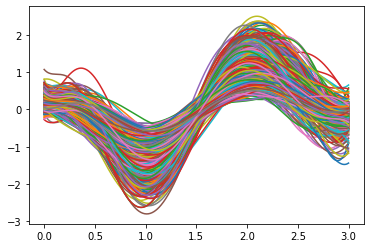

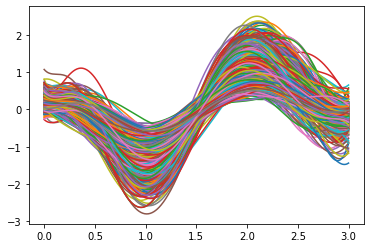

In [28]:
splinedMergeDataSetsCorrectVLFreal[0].plot()

In [29]:
splinedMergeDataSetsCorrectGridedVLFreal = splinedMergeDataSetsCorrectVLFreal[0].to_grid()
splinedMergeDataSetsCorrectGridedVLFreal

FDataGrid(
    array([[[ 0.25620951],
            [ 0.25294354],
            [ 0.25030552],
            ...,
            [-0.18704272],
            [-0.17363015],
            [-0.15904519]],
    
           [[ 0.14635778],
            [ 0.13910953],
            [ 0.1326342 ],
            ...,
            [-0.07818748],
            [-0.0807335 ],
            [-0.08369942]],
    
           [[ 0.25719272],
            [ 0.25622373],
            [ 0.25509834],
            ...,
            [-0.10853989],
            [-0.10562289],
            [-0.10252703]],
    
           ...,
    
           [[ 0.23510789],
            [ 0.23309542],
            [ 0.23105526],
            ...,
            [-0.10251507],
            [-0.10530445],
            [-0.10821535]],
    
           [[ 0.47199666],
            [ 0.45482519],
            [ 0.43916681],
            ...,
            [-0.31900629],
            [-0.32863455],
            [-0.33919567]],
    
           [[ 0.0501628 ],
            [ 0.

In [30]:
fdMergeDataSetsVLFimag=[]
for i in range(len(mergeDataSets)):
    x=mergeDataSets[:][i]['cell passing time (s)']
    y=mergeDataSets[:][i]['1 MHz imag (mV)']
    fdMergeDataSetsVLFimag.append(FDataGrid(y, x))
fdMergeDataSetsVLFimag

[FDataGrid(
     array([[[-0.09151404],
             [-0.09698955],
             [-0.11338972],
             [-0.14709926],
             [-0.16947846],
             [-0.27541658],
             [-0.59247266],
             [-0.91695641],
             [-1.26617805],
             [-1.63251545],
             [-1.88591732],
             [-2.16982308],
             [-2.37813797],
             [-2.12243329],
             [-1.77609459],
             [-1.28847775],
             [-0.67527749],
             [-0.14820251],
             [ 0.49959661],
             [ 1.10243491],
             [ 1.68395894],
             [ 2.31691561],
             [ 2.5810829 ],
             [ 2.49264271],
             [ 2.26339711],
             [ 1.90556455],
             [ 1.48652013],
             [ 1.10505489],
             [ 0.75767742],
             [ 0.47974156],
             [ 0.13919819],
             [-0.13730796],
             [-0.14651855],
             [-0.30750999],
             [-0.19095691],
        

In [31]:
splinedMergeDataSetsVLFimag=[]
for i in range(len(fdMergeDataSetsVLFimag)):
    basis = skfda.representation.basis.Monomial(n_basis=n_basis)
    temp = fdMergeDataSetsVLFimag[i].to_basis(basis)
    splinedMergeDataSetsVLFimag.append(temp)
len(splinedMergeDataSetsVLFimag)

4938

In [32]:
splinedMergeDataSetsCorrectVLFimag = splinedMergeDataSetsVLFimag
for i in range(1,len(splinedMergeDataSetsVLFreal)):
    b = splinedMergeDataSetsVLFimag[i].coefficients
    splinedMergeDataSetsCorrectVLFimag[0].coefficients = np.append(splinedMergeDataSetsCorrectVLFimag[0].coefficients,b,axis=0)
len(splinedMergeDataSetsCorrectVLFimag[0])

4938

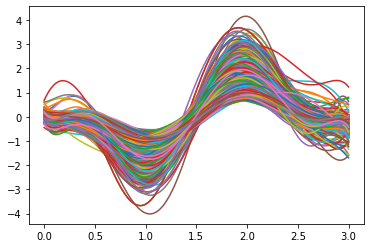

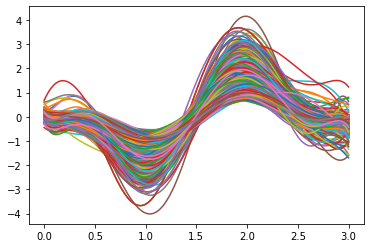

In [33]:
splinedMergeDataSetsCorrectVLFimag[0].plot()

In [34]:
splinedMergeDataSetsCorrectGridedVLFimag = splinedMergeDataSetsCorrectVLFimag[0].to_grid()
splinedMergeDataSetsCorrectGridedVLFimag

FDataGrid(
    array([[[-0.01107827],
            [-0.04202168],
            [-0.07001797],
            ...,
            [-0.29484441],
            [-0.32152634],
            [-0.350838  ]],
    
           [[ 0.01664751],
            [-0.00418546],
            [-0.02309371],
            ...,
            [-0.07156904],
            [-0.09304862],
            [-0.11654537]],
    
           [[ 0.17149479],
            [ 0.16026282],
            [ 0.14964505],
            ...,
            [-0.14797388],
            [-0.15564337],
            [-0.16431815]],
    
           ...,
    
           [[ 0.28025409],
            [ 0.26220859],
            [ 0.24517372],
            ...,
            [-0.19735862],
            [-0.21713471],
            [-0.23860083]],
    
           [[ 0.21366366],
            [ 0.17755745],
            [ 0.14448348],
            ...,
            [-0.36033697],
            [-0.39326572],
            [-0.42950591]],
    
           [[-0.10577491],
            [-0.

In [35]:
fdMergeDataSetsVHFreal=[]
for i in range(len(mergeDataSets)):
    x=mergeDataSets[:][i]['cell passing time (s)']
    y=mergeDataSets[:][i]['5 MHz real (mV)']
    fdMergeDataSetsVHFreal.append(FDataGrid(y, x))
fdMergeDataSetsVHFreal

[FDataGrid(
     array([[[-0.57066845],
             [-0.4959231 ],
             [-0.56721813],
             [-0.63493774],
             [-0.82496842],
             [-0.95643987],
             [-1.25981268],
             [-1.85540139],
             [-2.71509223],
             [-3.56510362],
             [-4.55443025],
             [-4.96522235],
             [-4.87671738],
             [-4.32309111],
             [-3.35462777],
             [-2.29117549],
             [-1.32715859],
             [-0.38674819],
             [ 0.55828571],
             [ 1.59769911],
             [ 3.09232068],
             [ 4.77088827],
             [ 6.01015497],
             [ 6.60578839],
             [ 6.34322897],
             [ 5.28268013],
             [ 3.54358316],
             [ 1.92820987],
             [ 0.88523513],
             [ 0.30344134],
             [ 0.01028932],
             [-0.12930811],
             [-0.32482343],
             [-0.13657653],
             [-0.38349865],
        

In [36]:
splinedMergeDataSetsVHFreal=[]
for i in range(len(fdMergeDataSetsVHFreal)):
    basis = skfda.representation.basis.Monomial(n_basis=n_basis)
    temp = fdMergeDataSetsVHFreal[i].to_basis(basis)
    splinedMergeDataSetsVHFreal.append(temp)
len(splinedMergeDataSetsVHFreal)

4938

In [37]:
splinedMergeDataSetsCorrectVHFreal = splinedMergeDataSetsVHFreal
for i in range(1,len(splinedMergeDataSetsVHFreal)):
    b = splinedMergeDataSetsVHFreal[i].coefficients
    splinedMergeDataSetsCorrectVHFreal[0].coefficients = np.append(splinedMergeDataSetsCorrectVHFreal[0].coefficients,b,axis=0)
len(splinedMergeDataSetsCorrectVHFreal[0])

4938

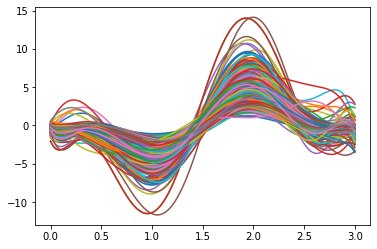

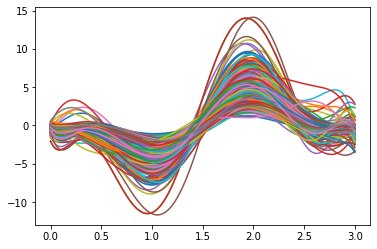

In [38]:
splinedMergeDataSetsCorrectVHFreal[0].plot()

In [39]:
splinedMergeDataSetsCorrectGridedVHFreal = splinedMergeDataSetsCorrectVHFreal[0].to_grid()
splinedMergeDataSetsCorrectGridedVHFreal

FDataGrid(
    array([[[-0.54155479],
            [-0.55274686],
            [-0.56260095],
            ...,
            [-0.46746025],
            [-0.58541037],
            [-0.71563867]],
    
           [[-0.16016987],
            [-0.2059482 ],
            [-0.24805099],
            ...,
            [-0.26677511],
            [-0.34802403],
            [-0.43672265]],
    
           [[-0.40918813],
            [-0.4214561 ],
            [-0.4321142 ],
            ...,
            [-0.16368705],
            [-0.21138884],
            [-0.26417143]],
    
           ...,
    
           [[-0.16711885],
            [-0.18290466],
            [-0.19731914],
            ...,
            [-0.28789578],
            [-0.33251106],
            [-0.38205544]],
    
           [[-0.25969733],
            [-0.35115524],
            [-0.43535611],
            ...,
            [-0.57315855],
            [-0.71598904],
            [-0.87269147]],
    
           [[ 0.01745383],
            [-0.

In [40]:
fdMergeDataSetsVHFimag=[]
for i in range(len(mergeDataSets)):
    x=mergeDataSets[:][i]['cell passing time (s)']
    y=mergeDataSets[:][i]['5 MHz imag (mV)']
    fdMergeDataSetsVHFimag.append(FDataGrid(y, x))
fdMergeDataSetsVHFimag

[FDataGrid(
     array([[[ 0.6476363 ],
             [ 0.59153774],
             [ 0.72981038],
             [ 0.85469796],
             [ 1.06599241],
             [ 1.43449723],
             [ 2.37783248],
             [ 3.32768336],
             [ 4.3575864 ],
             [ 5.2286772 ],
             [ 5.76401444],
             [ 6.48356656],
             [ 6.8514724 ],
             [ 6.25581   ],
             [ 5.49792919],
             [ 4.17278745],
             [ 2.46098157],
             [ 0.71971973],
             [-1.30620449],
             [-3.19297775],
             [-5.16188022],
             [-7.32426678],
             [-8.35098644],
             [-8.60086918],
             [-8.07118719],
             [-7.05616455],
             [-5.62103233],
             [-4.0343357 ],
             [-2.66148126],
             [-1.56544915],
             [-0.44962376],
             [ 0.43609658],
             [ 0.73650378],
             [ 1.06029641],
             [ 1.03959662],
        

In [41]:
splinedMergeDataSetsVHFimag=[]
for i in range(len(fdMergeDataSetsVHFimag)):
    basis = skfda.representation.basis.Monomial(n_basis=n_basis)
    temp = fdMergeDataSetsVHFimag[i].to_basis(basis)
    splinedMergeDataSetsVHFimag.append(temp)
len(splinedMergeDataSetsVHFimag)

4938

In [42]:
splinedMergeDataSetsCorrectVHFimag = splinedMergeDataSetsVHFimag
for i in range(1,len(splinedMergeDataSetsVHFimag)):
    b = splinedMergeDataSetsVHFimag[i].coefficients
    splinedMergeDataSetsCorrectVHFimag[0].coefficients = np.append(splinedMergeDataSetsCorrectVHFimag[0].coefficients,b,axis=0)
len(splinedMergeDataSetsCorrectVHFimag[0])

4938

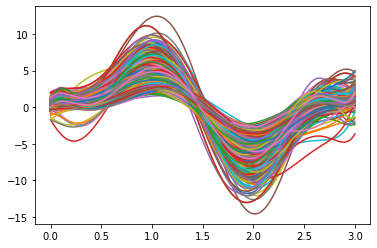

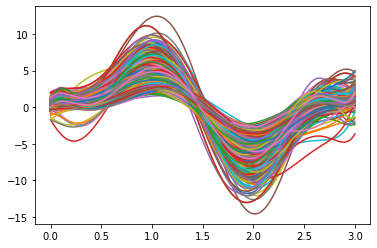

In [43]:
splinedMergeDataSetsCorrectVHFimag[0].plot()

In [44]:
splinedMergeDataSetsCorrectGridedVHFimag = splinedMergeDataSetsCorrectVHFimag[0].to_grid()
splinedMergeDataSetsCorrectGridedVHFimag

FDataGrid(
    array([[[ 0.52308354],
            [ 0.56119705],
            [ 0.59579699],
            ...,
            [ 1.32876215],
            [ 1.44188599],
            [ 1.56642575]],
    
           [[ 0.20613362],
            [ 0.24819061],
            [ 0.28646855],
            ...,
            [ 0.4245225 ],
            [ 0.50611417],
            [ 0.59566784]],
    
           [[-0.02195195],
            [-0.00537387],
            [ 0.0105433 ],
            ...,
            [ 0.5851202 ],
            [ 0.62399078],
            [ 0.66747912]],
    
           ...,
    
           [[-0.41711844],
            [-0.38403072],
            [-0.35223002],
            ...,
            [ 0.77318872],
            [ 0.84583464],
            [ 0.9251601 ]],
    
           [[ 0.01116481],
            [ 0.10430342],
            [ 0.1901749 ],
            ...,
            [ 1.55510642],
            [ 1.70237763],
            [ 1.86415709]],
    
           [[ 0.41582435],
            [ 0.

In [45]:
splinedMergeAllDataSetsCorrect = copy.copy(splinedMergeDataSetsCorrectVLFreal[0])


In [46]:
stack1 = np.concatenate((splinedMergeAllDataSetsCorrect.coefficients,splinedMergeDataSetsCorrectVLFimag[0].coefficients),axis=0)
stack2 = np.concatenate((stack1,splinedMergeDataSetsCorrectVHFreal[0].coefficients),axis=0)
stack3 = np.concatenate((stack2,splinedMergeDataSetsCorrectVHFimag[0].coefficients),axis=0)

In [47]:
splinedMergeAllDataSetsCorrect.coefficients = stack3

In [48]:
splinedMergeAllDataSetsCorrect

FDataBasis(
    basis=Monomial(domain_range=((0.0, 3.0),), n_basis=9),
    coefficients=[[ 2.56209513e-01 -6.00138931e-01  9.59710640e+00 ...  1.70590995e+01
      -2.99322502e+00  2.13655321e-01]
     [ 1.46357783e-01 -1.27486346e+00  1.13406234e+01 ...  6.62487618e+00
      -8.80811021e-01  3.90726807e-02]
     [ 2.57192715e-01 -1.48564001e-01 -2.14660834e+00 ...  6.86803559e-01
       1.18060124e-02 -1.18089857e-02]
     ...
     [-4.17118437e-01  5.62380245e+00 -1.83574111e+01 ...  3.16059983e+01
      -9.01337977e+00  9.27143827e-01]
     [ 1.11648060e-02  1.61459382e+01 -1.05257915e+02 ...  1.08780775e+01
      -8.66059034e+00  1.18021349e+00]
     [ 4.15824345e-01  3.74426466e+00 -4.59178990e+01 ...  3.76969931e+00
      -3.69538755e+00  5.12739211e-01]],
    dataset_name=None,
    argument_names=(None,),
    coordinate_names=(None,),
    extrapolation=None)

In [49]:
y_type_num = [*cellem_data["type.num"].tolist(), *cellem_data["type.num"].tolist(),*cellem_data["type.num"].tolist(),*cellem_data["type.num"].tolist()]
len(y_type_num)

19752

In [50]:
splinedMergeAllDataSetsCorrectGrided = splinedMergeAllDataSetsCorrect.to_grid()
splinedMergeAllDataSetsCorrectGrided

FDataGrid(
    array([[[ 0.25620951],
            [ 0.25294354],
            [ 0.25030552],
            ...,
            [-0.18704272],
            [-0.17363015],
            [-0.15904519]],
    
           [[ 0.14635778],
            [ 0.13910953],
            [ 0.1326342 ],
            ...,
            [-0.07818748],
            [-0.0807335 ],
            [-0.08369942]],
    
           [[ 0.25719272],
            [ 0.25622373],
            [ 0.25509834],
            ...,
            [-0.10853989],
            [-0.10562289],
            [-0.10252703]],
    
           ...,
    
           [[-0.41711844],
            [-0.38403072],
            [-0.35223002],
            ...,
            [ 0.77318872],
            [ 0.84583464],
            [ 0.9251601 ]],
    
           [[ 0.01116481],
            [ 0.10430342],
            [ 0.1901749 ],
            ...,
            [ 1.55510642],
            [ 1.70237763],
            [ 1.86415709]],
    
           [[ 0.41582435],
            [ 0.

# Machine learning x FDA

1 2
3959 979


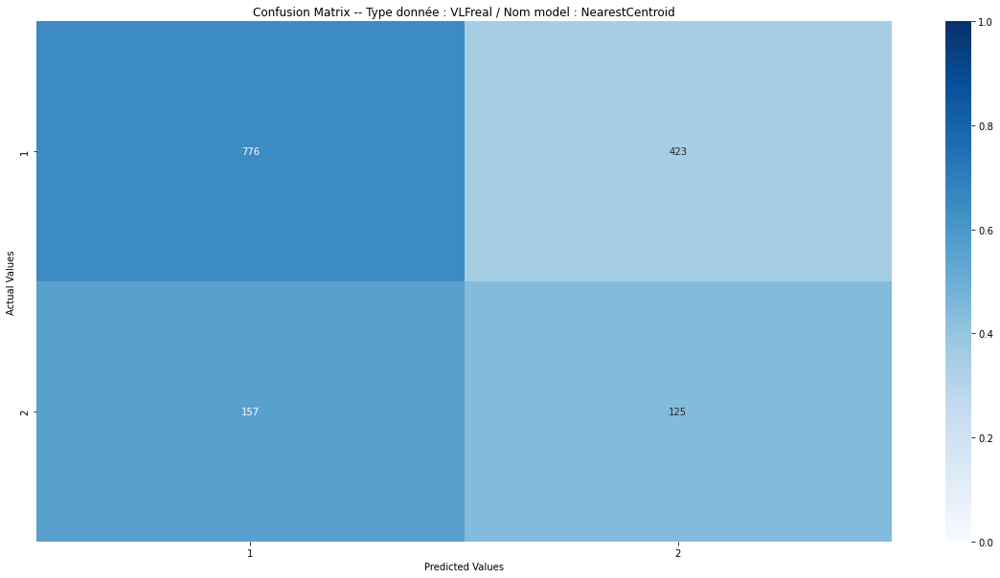

Accuracy : 0.6083727211343687

              precision    recall  f1-score   support

           1       0.83      0.65      0.73      1199
           2       0.23      0.44      0.30       282

    accuracy                           0.61      1481
   macro avg       0.53      0.55      0.51      1481
weighted avg       0.72      0.61      0.65      1481




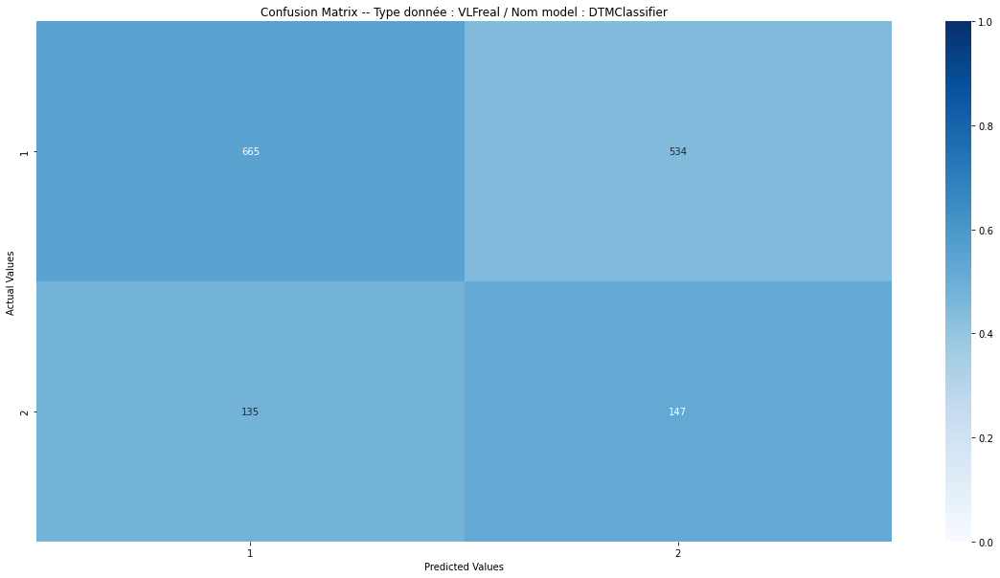

Accuracy : 0.5482781904118839

              precision    recall  f1-score   support

           1       0.83      0.55      0.67      1199
           2       0.22      0.52      0.31       282

    accuracy                           0.55      1481
   macro avg       0.52      0.54      0.49      1481
weighted avg       0.71      0.55      0.60      1481




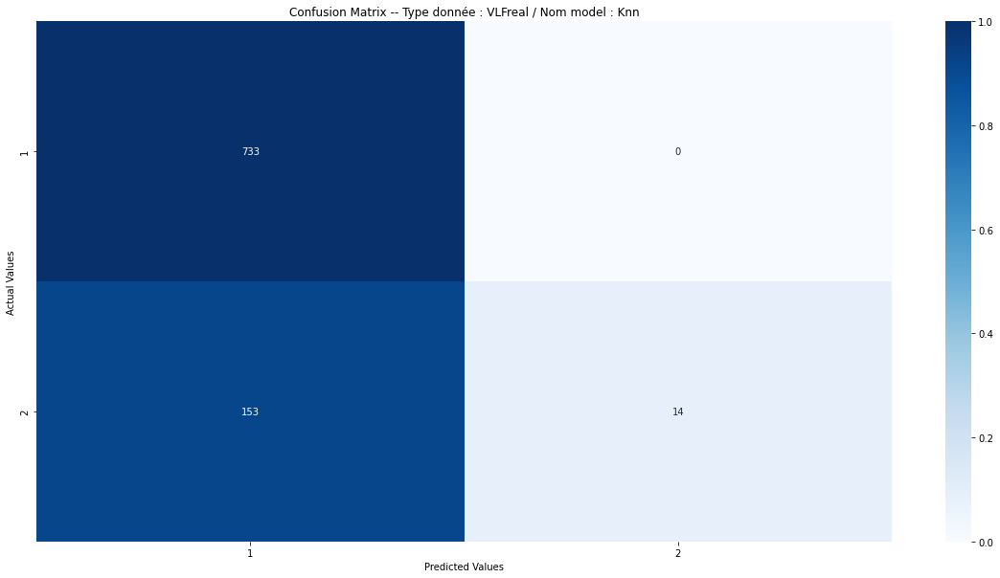

Accuracy : 0.83

              precision    recall  f1-score   support

           1       0.83      1.00      0.91       733
           2       1.00      0.08      0.15       167

    accuracy                           0.83       900
   macro avg       0.91      0.54      0.53       900
weighted avg       0.86      0.83      0.77       900


1 2
3959 979


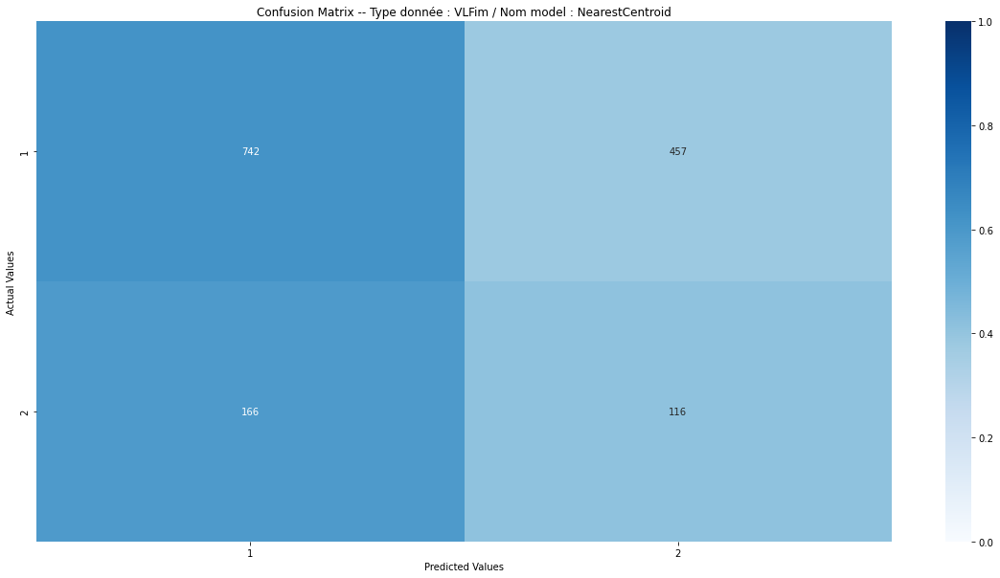

Accuracy : 0.5793382849426063

              precision    recall  f1-score   support

           1       0.82      0.62      0.70      1199
           2       0.20      0.41      0.27       282

    accuracy                           0.58      1481
   macro avg       0.51      0.52      0.49      1481
weighted avg       0.70      0.58      0.62      1481




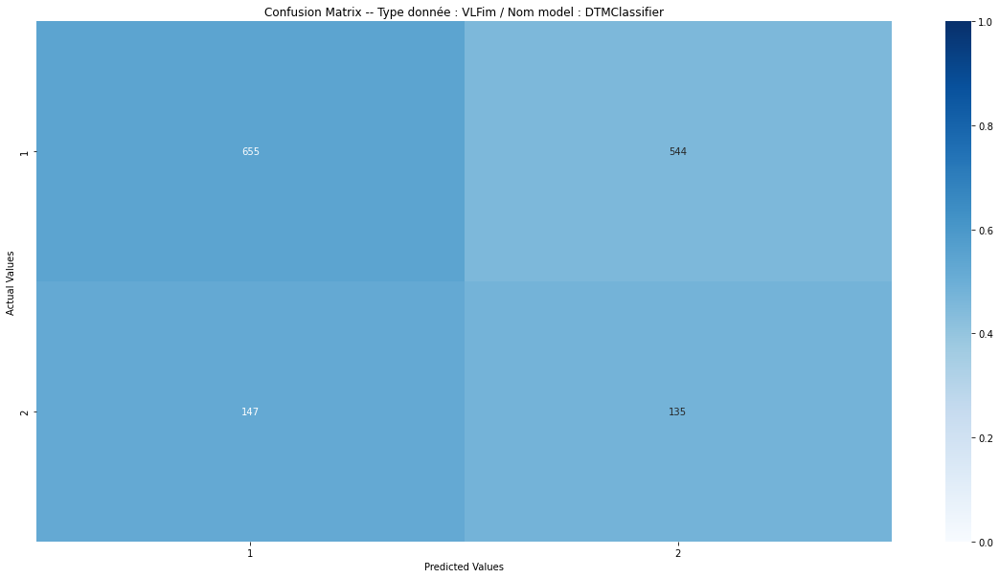

Accuracy : 0.5334233625928426

              precision    recall  f1-score   support

           1       0.82      0.55      0.65      1199
           2       0.20      0.48      0.28       282

    accuracy                           0.53      1481
   macro avg       0.51      0.51      0.47      1481
weighted avg       0.70      0.53      0.58      1481




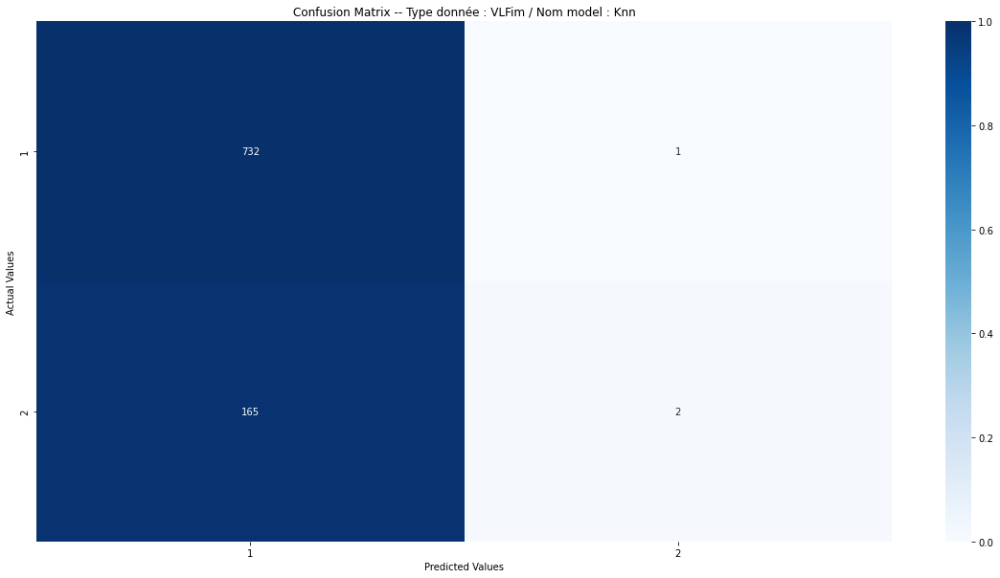

Accuracy : 0.8155555555555556

              precision    recall  f1-score   support

           1       0.82      1.00      0.90       733
           2       0.67      0.01      0.02       167

    accuracy                           0.82       900
   macro avg       0.74      0.51      0.46       900
weighted avg       0.79      0.82      0.74       900


1 2
3959 979


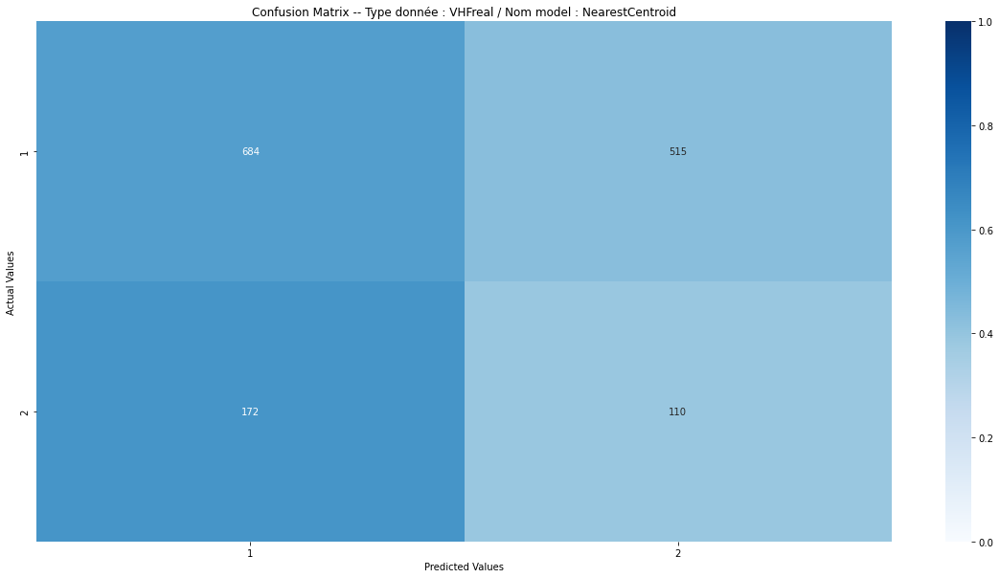

Accuracy : 0.5361242403781229

              precision    recall  f1-score   support

           1       0.80      0.57      0.67      1199
           2       0.18      0.39      0.24       282

    accuracy                           0.54      1481
   macro avg       0.49      0.48      0.45      1481
weighted avg       0.68      0.54      0.59      1481




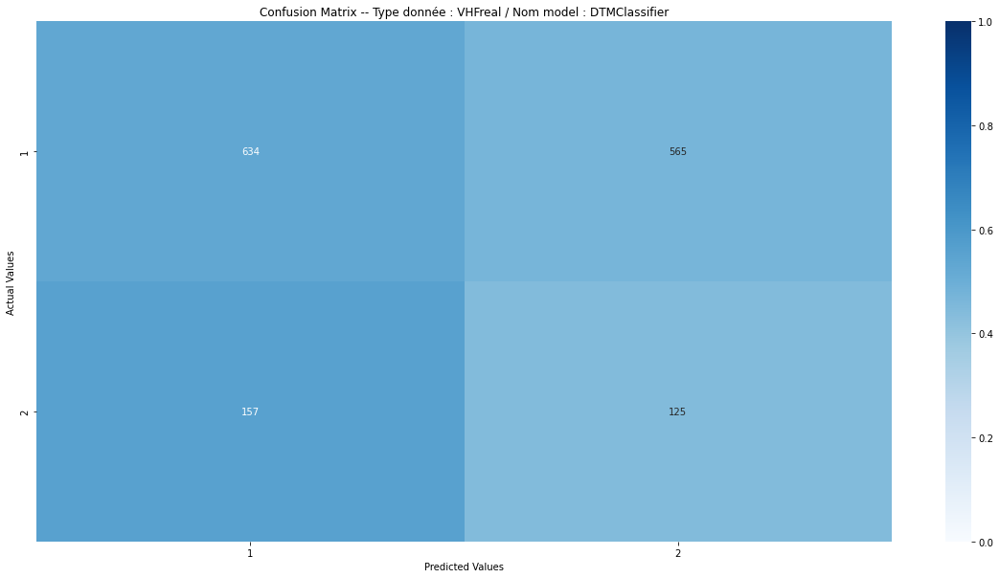

Accuracy : 0.512491559756921

              precision    recall  f1-score   support

           1       0.80      0.53      0.64      1199
           2       0.18      0.44      0.26       282

    accuracy                           0.51      1481
   macro avg       0.49      0.49      0.45      1481
weighted avg       0.68      0.51      0.56      1481




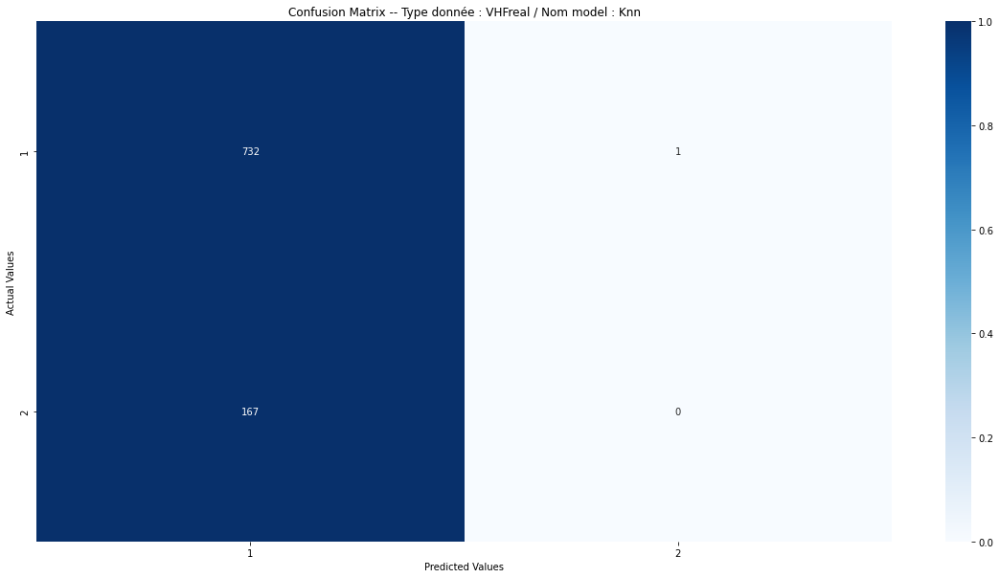

Accuracy : 0.8133333333333334

              precision    recall  f1-score   support

           1       0.81      1.00      0.90       733
           2       0.00      0.00      0.00       167

    accuracy                           0.81       900
   macro avg       0.41      0.50      0.45       900
weighted avg       0.66      0.81      0.73       900


1 2
3959 979


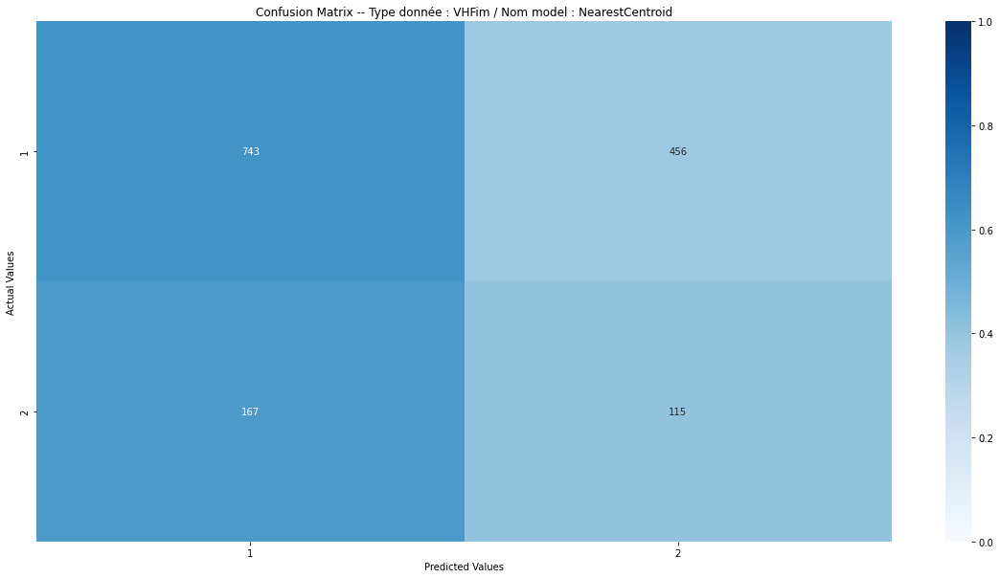

Accuracy : 0.5793382849426063

              precision    recall  f1-score   support

           1       0.82      0.62      0.70      1199
           2       0.20      0.41      0.27       282

    accuracy                           0.58      1481
   macro avg       0.51      0.51      0.49      1481
weighted avg       0.70      0.58      0.62      1481




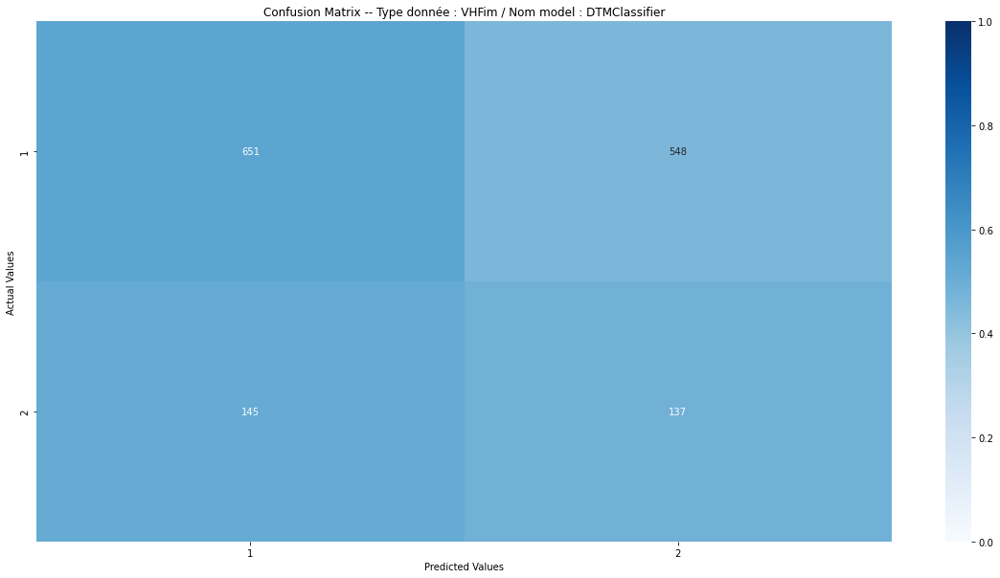

Accuracy : 0.5320729237002025

              precision    recall  f1-score   support

           1       0.82      0.54      0.65      1199
           2       0.20      0.49      0.28       282

    accuracy                           0.53      1481
   macro avg       0.51      0.51      0.47      1481
weighted avg       0.70      0.53      0.58      1481




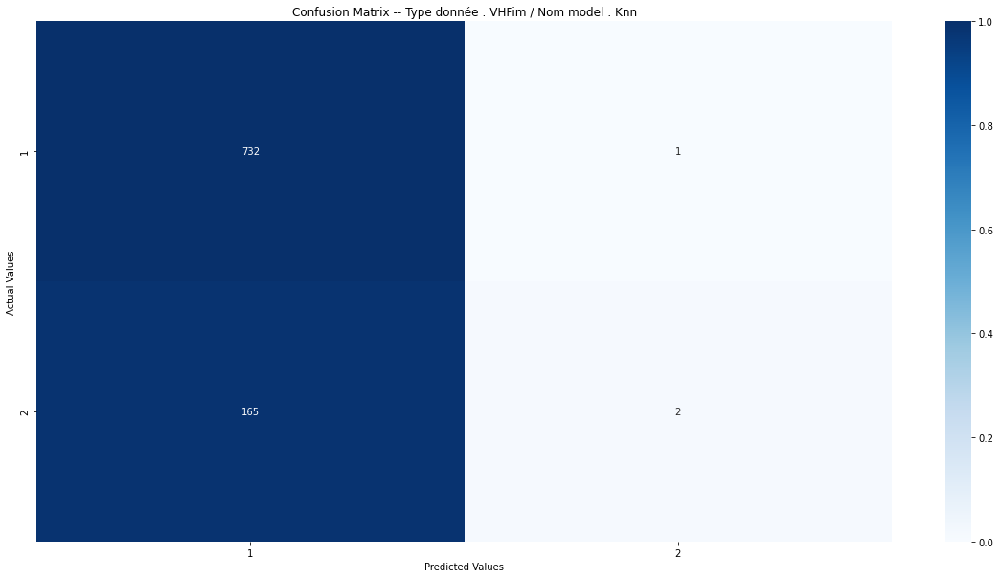

Accuracy : 0.8155555555555556

              precision    recall  f1-score   support

           1       0.82      1.00      0.90       733
           2       0.67      0.01      0.02       167

    accuracy                           0.82       900
   macro avg       0.74      0.51      0.46       900
weighted avg       0.79      0.82      0.74       900


1 2
3959 979


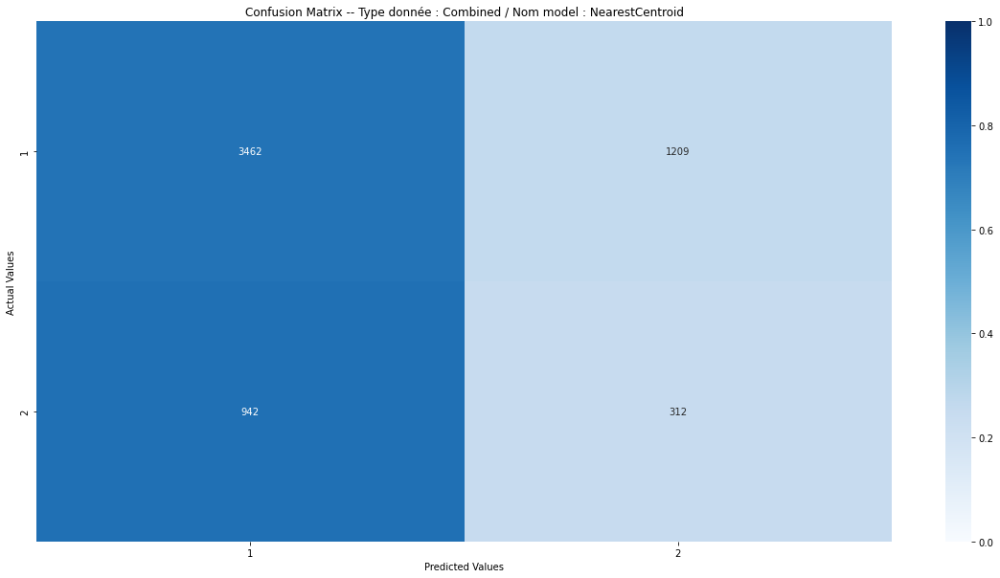

Accuracy : 0.6369620253164557

              precision    recall  f1-score   support

           1       0.79      0.74      0.76      4671
           2       0.21      0.25      0.22      1254

    accuracy                           0.64      5925
   macro avg       0.50      0.49      0.49      5925
weighted avg       0.66      0.64      0.65      5925




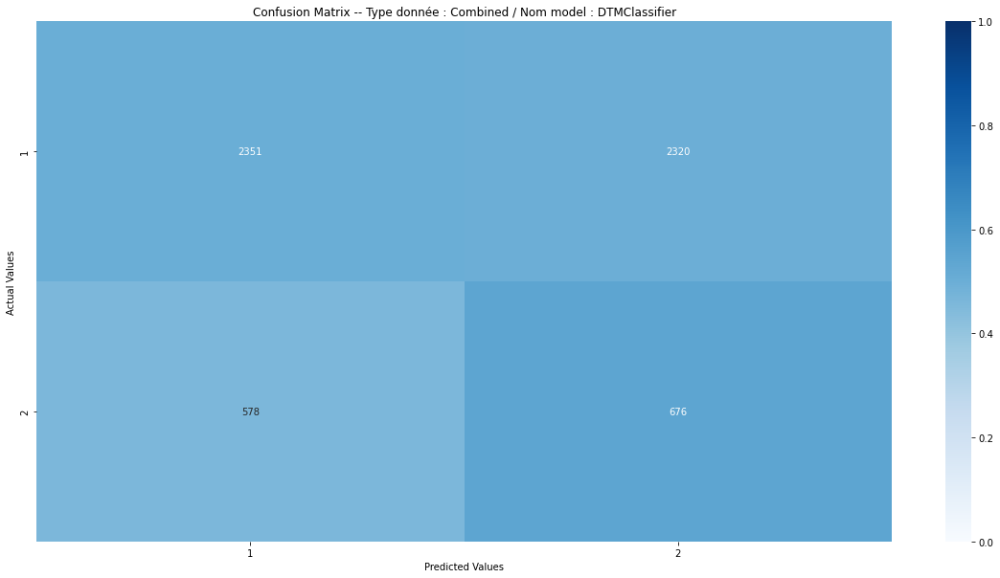

Accuracy : 0.5108860759493671

              precision    recall  f1-score   support

           1       0.80      0.50      0.62      4671
           2       0.23      0.54      0.32      1254

    accuracy                           0.51      5925
   macro avg       0.51      0.52      0.47      5925
weighted avg       0.68      0.51      0.56      5925




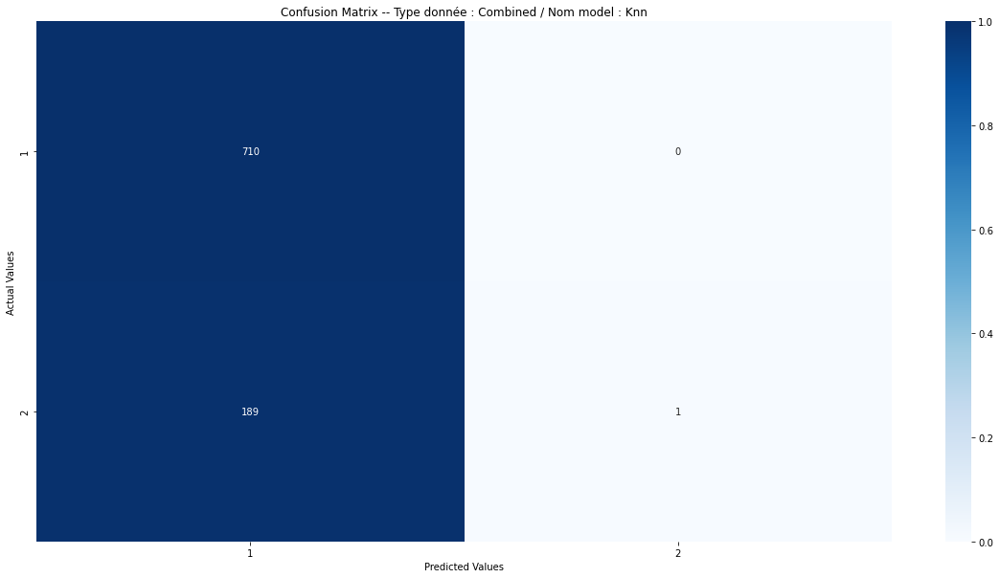

Accuracy : 0.79

              precision    recall  f1-score   support

           1       0.79      1.00      0.88       710
           2       1.00      0.01      0.01       190

    accuracy                           0.79       900
   macro avg       0.89      0.50      0.45       900
weighted avg       0.83      0.79      0.70       900




In [92]:
test_size = 0.3
y_unique = [*cellem_data["type.num"].tolist()]
value_type = [("VLFreal", splinedMergeDataSetsCorrectGridedVLFreal, y_unique),
              ("VLFim", splinedMergeDataSetsCorrectGridedVLFimag, y_unique),
              ("VHFreal", splinedMergeDataSetsCorrectGridedVHFreal, y_unique),
              ("VHFim", splinedMergeDataSetsCorrectGridedVHFimag, y_unique),
              ("Combined", splinedMergeAllDataSetsCorrectGrided, y_type_num)]

for name_grid, X, y in value_type:
  print(*list(set(y)))
  print(*(cellem_data["type.num"].value_counts()))

  classifier = [("NearestCentroid", NearestCentroid(), len(X)),
                ("DTMClassifier",DTMClassifier(proportiontocut=0.75),len(X)),
                ("Knn", KNeighborsClassifier(n_neighbors=30), 3000)]

  for nom, model, slice_indice in classifier:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, shuffle=True, random_state=0)
    X_train = X_train[:slice_indice]
    X_test = X_test[:int(slice_indice*test_size)]
    y_train = y_train[:slice_indice]
    y_test = y_test[:int(slice_indice*test_size)]
    
    y_train_dict = dict([(n, y_train.count(n)) for n in set(y_train)])
    y_test_dict = dict([(n, y_test.count(n)) for n in set(y_test)])

    model.fit(X_train, y_train)
    validation = model.predict(X_test)

    confusion_matrix_value = confusion_matrix(y_test, validation)
    confusion_matrix_normalized = confusion_matrix_value.astype('float') / confusion_matrix_value.sum(axis=1)[:, np.newaxis]
    confusion_matrix_withlabel = pd.DataFrame(confusion_matrix_normalized,
                                          index = [*list(y_train_dict.keys())],
                                          columns = [*list(y_train_dict.keys())])
    plt.figure(figsize=(20,10))
    ax = sns.heatmap(confusion_matrix_withlabel, cmap="Blues", annot=confusion_matrix_value, fmt='g',vmin=0, vmax=1)
    plt.title(f'Confusion Matrix -- Type donnée : {name_grid} / Nom model : {nom}')
    plt.ylabel('Actual Values')
    plt.xlabel('Predicted Values')
    plt.show()

    print(f'Accuracy : {accuracy_score(y_test, validation)}\n')
    print(f'{classification_report(y_test, validation)}\n')

Back-up

In [ ]:
#splinedMergeAllDataSetsCorrect = copy.copy(splinedMergeDataSetsCorrectVLFreal[0])
#splinedMergeAllDataSetsCorrect.coefficients = [[]]

#splinedMergeAllDataSetsCorrect.coefficients[0] = [splinedMergeDataSetsCorrectVLFreal[0].coefficients[0].tolist()]
#for i in range(1,len(splinedMergeDataSetsCorrectVLFreal)):
#    splinedMergeAllDataSetsCorrect.coefficients = np.append(splinedMergeAllDataSetsCorrect.coefficients,[[splinedMergeDataSetsCorrectVLFreal[i].coefficients[0].tolist()]],axis=0).tolist()

#for i in range(len(splinedMergeDataSetsCorrectVLFreal)):
#    splinedMergeAllDataSetsCorrect.coefficients[i] = np.append(splinedMergeAllDataSetsCorrect.coefficients[i],[splinedMergeDataSetsCorrectVLFimag[0].coefficients[i].tolist()],axis=0).tolist()
#    splinedMergeAllDataSetsCorrect.coefficients[i] = np.append(splinedMergeAllDataSetsCorrect.coefficients[i],[splinedMergeDataSetsCorrectVHFreal[0].coefficients[i].tolist()],axis=0).tolist()
#    splinedMergeAllDataSetsCorrect.coefficients[i] = np.append(splinedMergeAllDataSetsCorrect.coefficients[i],[splinedMergeDataSetsCorrectVHFimag[0].coefficients[i].tolist()],axis=0).tolist()
#splinedMergeAllDataSetsCorrect

#len(splinedMergeAllDataSetsCorrect)

#splinedMergeDataSetsCorrectGrided

#splinedMergeAllDataSetsCorrectGrided = copy.copy(splinedMergeDataSetsCorrectGrided)
#splinedMergeAllDataSetsCorrectGrided.data_matrix = np.array(splinedMergeAllDataSetsCorrect.coefficients)
#splinedMergeAllDataSetsCorrectGrided.grid_points = np.append(splinedMergeAllDataSetsCorrectGrided.grid_points,[splinedMergeAllDataSetsCorrectGrided.grid_points[0]],axis=0)
#splinedMergeAllDataSetsCorrectGrided.grid_points = np.append(splinedMergeAllDataSetsCorrectGrided.grid_points,[splinedMergeAllDataSetsCorrectGrided.grid_points[0]],axis=0)
#splinedMergeAllDataSetsCorrectGrided.grid_points = np.append(splinedMergeAllDataSetsCorrectGrided.grid_points,[splinedMergeAllDataSetsCorrectGrided.grid_points[0]],axis=0)
#splinedMergeAllDataSetsCorrectGrided